# NASA CMAPSS-Dataset - Preprocessing

## 1. Data Loading

In [2]:
from src.data.load_data import load_cmapss_data, load_test_rul_cmapss_data

df_train = load_cmapss_data('FD001', 'train')
df_test = load_cmapss_data('FD001', 'test')
df_test_RUL = load_test_rul_cmapss_data('FD001')

## 2. Preprocessing

In [3]:
# check for nan values
print(f"Summary of nan-values:\n{df_train.isna().sum()}")

Summary of nan-values:
engine                                            0
cycle                                             0
throttle resolver angle                           0
altitude                                          0
mach number                                       0
(Fan inlet total temperature) (◦R)                0
(LPC outlet total temperature) (◦R)               0
(HPC outlet total temperature) (◦R)               0
(LPT outlet total temperature) (◦R)               0
(Fan inlet Pressure) (psia)                       0
(bypass-duct total pressure) (psia)               0
(HPC outlet total pressure) (psia)                0
(Physical fan speed) (rpm)                        0
(Physical core speed) (rpm)                       0
(Engine pressure ratio(P50/P2)                    0
(HPC outlet Static pressure) (psia)               0
(Ratio of fuel flow to Ps30) (pps/psia)           0
(Corrected fan speed) (rpm)                       0
(Corrected core speed) (rpm)             

No nan-values present in train-dataset.

In [4]:
# drop features wiht constant values
from src.config import setting_names, sensor_names

all_features = list(setting_names + sensor_names)
features_constant_values = df_train[all_features].columns[df_train[all_features].nunique() == 1].tolist()

print("Following columns have constant values:")
print("\n".join(features_constant_values))

df_train.drop(features_constant_values, axis=1, inplace=True)
df_test.drop(features_constant_values, axis=1, inplace=True)

Following columns have constant values:
mach number
(Fan inlet total temperature) (◦R)
(Fan inlet Pressure) (psia)
(Engine pressure ratio(P50/P2)
(Burner fuel-air ratio)
(Demanded fan speed) (rpm)
(Demanded corrected fan speed) (rpm)


In [5]:
# drop highly correlated features
import numpy as np

correlation_matrix = df_train.corr().abs() # (19x19)
upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape),k=1).astype(bool))
high_correlation_features = [col for col in upper_tri.columns if any(upper_tri[col] > 0.95)]
print(f"Highly correlated features are:\n{high_correlation_features}")

df_train.drop(high_correlation_features,axis=1,inplace=True)
df_test.drop(high_correlation_features,axis=1,inplace=True)

Highly correlated features are:
['(Corrected core speed) (rpm)']


In [6]:
df_train.columns

Index(['engine', 'cycle', 'throttle resolver angle', 'altitude',
       '(LPC outlet total temperature) (◦R)',
       '(HPC outlet total temperature) (◦R)',
       '(LPT outlet total temperature) (◦R)',
       '(bypass-duct total pressure) (psia)',
       '(HPC outlet total pressure) (psia)', '(Physical fan speed) (rpm)',
       '(Physical core speed) (rpm)', '(HPC outlet Static pressure) (psia)',
       '(Ratio of fuel flow to Ps30) (pps/psia)',
       '(Corrected fan speed) (rpm)', '(Bypass Ratio) ', '(Bleed Enthalpy)',
       '(High-pressure turbines coolant bleed) (lbm/s)',
       '(Low-pressure turbines coolant bleed) (lbm/s)'],
      dtype='object')

## 3. Feature Engineering

In [7]:
# define the maximum life of each engine
df_train_RUL = df_train.groupby('engine').agg({'cycle':'max'})
df_train_RUL.rename(columns={'cycle':'end_of_life'}, inplace=True)
df_train_RUL.head()

,end_of_life
engine,
1,192
2,287
3,179
4,189
5,269


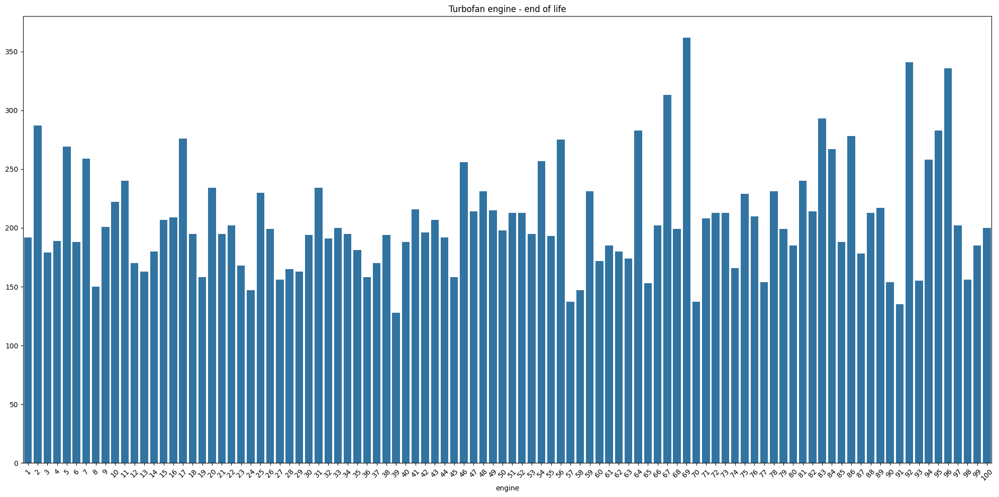

In [8]:
# plot rul for all engines
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(20,10))
sns.barplot(x=df_train_RUL.index, y=df_train_RUL['end_of_life'].values)
plt.xticks(rotation=45)
plt.title("Turbofan engine - end of life")
plt.tight_layout()
plt.show()

In [9]:
import pandas as pd

df_train = pd.merge(df_train, df_train_RUL, how='left', on=['engine'])
df_train['RUL'] = df_train['end_of_life'] - df_train['cycle']
df_train.drop(['end_of_life'], axis=1, inplace=True)
df_train.head()

,engine,cycle,throttle resolver angle,altitude,(LPC outlet total temperature) (◦R),(HPC outlet total temperature) (◦R),(LPT outlet total temperature) (◦R),(bypass-duct total pressure) (psia),(HPC outlet total pressure) (psia),(Physical fan speed) (rpm),(Physical core speed) (rpm),(HPC outlet Static pressure) (psia),(Ratio of fuel flow to Ps30) (pps/psia),(Corrected fan speed) (rpm),(Bypass Ratio),(Bleed Enthalpy),(High-pressure turbines coolant bleed) (lbm/s),(Low-pressure turbines coolant bleed) (lbm/s),RUL
0,1,1,-0.0007,-0.0004,641.82,1589.70,1400.60,21.61,554.36,2388.06,9046.19,47.47,521.66,2388.02,8.4195,392,39.06,23.4190,191
1,1,2,0.0019,-0.0003,642.15,1591.82,1403.14,21.61,553.75,2388.04,9044.07,47.49,522.28,2388.07,8.4318,392,39.00,23.4236,190
2,1,3,-0.0043,0.0003,642.35,1587.99,1404.20,21.61,554.26,2388.08,9052.94,47.27,522.42,2388.03,8.4178,390,38.95,23.3442,189
3,1,4,0.0007,0.0000,642.35,1582.79,1401.87,21.61,554.45,2388.11,9049.48,47.13,522.86,2388.08,8.3682,392,38.88,23.3739,188
4,1,5,-0.0019,-0.0002,642.37,1582.85,1406.22,21.61,554.00,2388.06,9055.15,47.28,522.19,2388.04,8.4294,393,38.90,23.4044,187


In [10]:
df_train[df_train['engine'] == 1][["cycle", "RUL"]]

,cycle,RUL
0,1,191
1,2,190
2,3,189
3,4,188
4,5,187
...,...,...
187,188,4
188,189,3
189,190,2
190,191,1


This means engine 1 fails at cycle 192:
- at cycle 1 rul is 191
- at cycle 188 rul is 4
- at cycle 192 rul is 0

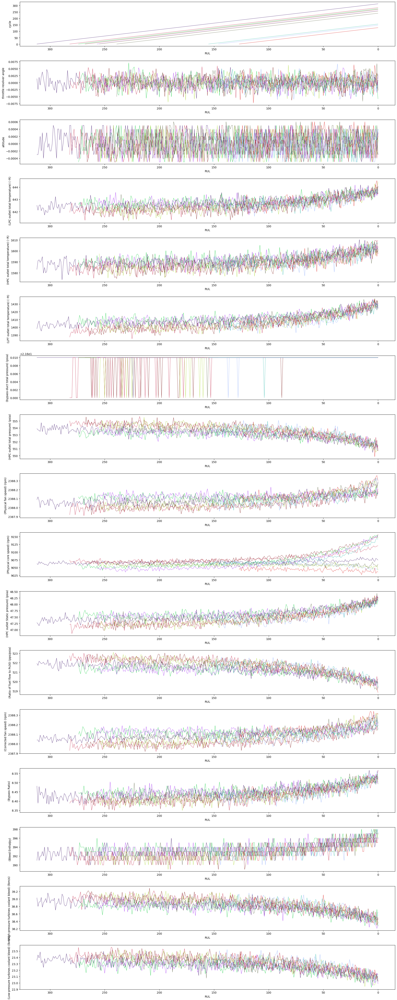

In [11]:
# plot features for 10 random engines over rul
import random

plot_items = list(df_train.columns)[1:-1]
fig, axes = plt.subplots(len(plot_items), figsize=(20,50))

for ax in axes:
    ax.invert_xaxis()

number_of_engines_to_plot = 10
engines = list(df_train['engine'].unique())
random_engines = random.sample(engines, number_of_engines_to_plot)

def generate_random_hex_colors(num_colors):
    colors = []
    for _ in range(num_colors):
        # Generate a random hex color code
        hex_color_code = '#%06x' % random.randint(0, 0xFFFFFF)
        colors.append(hex_color_code)
    return colors

random_colors = generate_random_hex_colors(number_of_engines_to_plot)

for engine_idx, engine in enumerate(random_engines):
  for idx, item in enumerate(plot_items):
    f = sns.lineplot(data=df_train[df_train['engine'] == engine],
                     x='RUL', y=item, color=random_colors[engine_idx],
                     linewidth=0.6, ax=axes[idx])

plt.tight_layout()
plt.show()

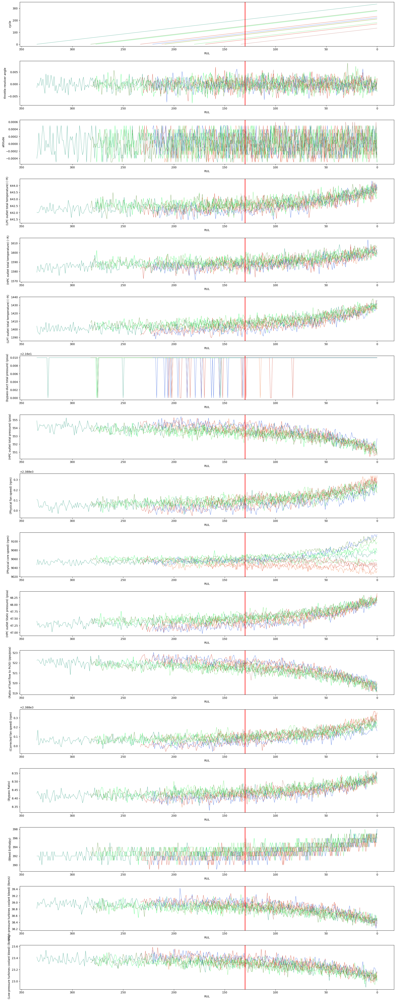

In [12]:
# plot features for 10 random engines over rul
import random

plot_items = list(df_train.columns)[1:-1]
fig, axes = plt.subplots(len(plot_items), figsize=(20,50))

for ax in axes:
    ax.invert_xaxis()

number_of_engines_to_plot = 10
engines = list(df_train['engine'].unique())
random_engines = random.sample(engines, number_of_engines_to_plot)

def generate_random_hex_colors(num_colors):
    colors = []
    for _ in range(num_colors):
        # Generate a random hex color code
        hex_color_code = '#%06x' % random.randint(0, 0xFFFFFF)
        colors.append(hex_color_code)
    return colors

random_colors = generate_random_hex_colors(number_of_engines_to_plot)

for engine_idx, engine in enumerate(random_engines):
  for idx, item in enumerate(plot_items):
    f = sns.lineplot(data=df_train[df_train['engine'] == engine],
                     x='RUL', y=item, color=random_colors[engine_idx],
                     linewidth=0.6, ax=axes[idx])

# for ax in axes:
    axes[idx].axvline(x=130, ymin=0.0, ymax=1.0, color='red')

plt.tight_layout()
plt.show()

We can see that the degradation of the engines starts ca. at 130 RUL. Therefore setting the max_rul to 130 could have the advantage that the model sees constant rul for constant sensor features values. This will make the model more robust and avoids overfitting. The goal for predictive maintenance is to detect the start of degradation, not total engine life.

In [13]:
RUL_MAX = 130
df_train.loc[df_train['RUL']>RUL_MAX, 'RUL'] = RUL_MAX

In [14]:
import statsmodels.api as sm

def backward_regression(X,y,initial_list=[], threshold_out=0.05, verbose=True):
  """To select feature with Backward Elimination Regression
  Args:
    X - feature values (pd.DataFrame)
    y - target variable (pd.Series)
    initial_list - features header
    threshold_out - pvalue threshold of features to drop
    verbose -- true to produce lots of logging output
  Returns:
    list of selected feature for modeling
  """
  included = list(X.columns)
  while True:
    changed = False
    model = sm.OLS(y, sm.add_constant(X[included])).fit()
    pvalues = model.pvalues.iloc[1:] # do not include intercept beta_0
    worst_pval = pvalues.max() # null if pvalues is empty
    if worst_pval > threshold_out:
      changed = True
      worst_feature = pvalues.idxmax()
      included.remove(worst_feature)
      if verbose:
        print(f"worst_feature: {worst_feature}, {worst_pval}")
    if not changed:
      break
  return included

# Application:
X = df_train.iloc[:, 1:-1]
y = df_train.iloc[:, -1]

final_features = backward_regression(X,y)
print(f"\nSelected features: \n{final_features}")
print(f"\nNumber of chosen features are: {len(final_features)}")

worst_feature: throttle resolver angle, 0.35458814255828297
worst_feature: altitude, 0.1527189513438999

Selected features: 
['cycle', '(LPC outlet total temperature) (◦R)', '(HPC outlet total temperature) (◦R)', '(LPT outlet total temperature) (◦R)', '(bypass-duct total pressure) (psia)', '(HPC outlet total pressure) (psia)', '(Physical fan speed) (rpm)', '(Physical core speed) (rpm)', '(HPC outlet Static pressure) (psia)', '(Ratio of fuel flow to Ps30) (pps/psia)', '(Corrected fan speed) (rpm)', '(Bypass Ratio) ', '(Bleed Enthalpy)', '(High-pressure turbines coolant bleed) (lbm/s)', '(Low-pressure turbines coolant bleed) (lbm/s)']

Number of chosen features are: 15


In [15]:
# extract last cycle from df_test for training
df_test_max = df_test[df_test['cycle'] == df_test.groupby(['engine'])['cycle'].transform('max')]
df_test_max.head()

,engine,cycle,throttle resolver angle,altitude,(LPC outlet total temperature) (◦R),(HPC outlet total temperature) (◦R),(LPT outlet total temperature) (◦R),(bypass-duct total pressure) (psia),(HPC outlet total pressure) (psia),(Physical fan speed) (rpm),(Physical core speed) (rpm),(HPC outlet Static pressure) (psia),(Ratio of fuel flow to Ps30) (pps/psia),(Corrected fan speed) (rpm),(Bypass Ratio),(Bleed Enthalpy),(High-pressure turbines coolant bleed) (lbm/s),(Low-pressure turbines coolant bleed) (lbm/s)
30,1,31,-0.0006,0.0004,642.58,1581.22,1398.91,21.61,554.42,2388.08,9056.40,47.23,521.79,2388.06,8.4024,393,38.81,23.3552
79,2,49,0.0018,-0.0001,642.55,1586.59,1410.83,21.61,553.52,2388.10,9044.77,47.67,521.74,2388.09,8.4505,391,38.81,23.2618
205,3,126,-0.0016,0.0004,642.88,1589.75,1418.89,21.61,552.59,2388.16,9049.26,47.88,520.83,2388.14,8.4119,395,38.93,23.2740
311,4,106,0.0012,0.0004,642.78,1594.53,1406.88,21.61,552.64,2388.13,9051.30,47.65,521.88,2388.11,8.4634,395,38.58,23.2581
409,5,98,-0.0013,-0.0004,642.27,1589.94,1419.36,21.61,553.29,2388.10,9053.99,47.46,521.00,2388.15,8.4362,394,38.75,23.4117


In [16]:
# prepare input and target data for train and test
X_train = df_train[final_features] # contains all cycles for each engine
y_train = df_train.iloc[:,-1]
X_test = df_test_max[final_features] # contains only the maximum available cycle for each engine
y_test = df_test_RUL.iloc[:,-1]
y_test_capped = np.minimum(df_test_RUL.iloc[:,-1], 130)

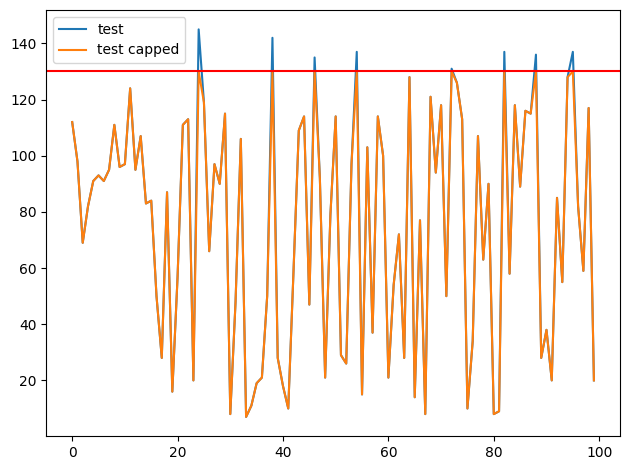

In [17]:
# plot y-test-values for uncapped and capped scenario

plt.plot(y_test, label="test")
plt.plot(y_test_capped, label="test capped")
plt.axhline(y=130, color="red")
plt.legend()
plt.tight_layout()
plt.show()

In [18]:
from sklearn.preprocessing import MinMaxScaler

scaler_x = MinMaxScaler()
scaler_y = MinMaxScaler()

X_train_scaled = scaler_x.fit_transform(X_train)
X_test_scaled = scaler_x.transform(X_test)

y_train_scaled = scaler_y.fit_transform(y_train.values.reshape(-1,1))
y_test_scaled = scaler_y.transform(y_test.values.reshape(-1,1))
y_test_capped_scaled = scaler_y.transform(y_test_capped.values.reshape(-1,1))

I have decided to use the MinMaxScaler over StandardScaler, because I want to train multiple models like Random Forest Regressor, SVM, KNN and LSTM. For the LSTM MinMaxScaler will be necessary, for the other ones the MinMaxScaler is acceptable.

I evaluate performance later using both capped RUL reflecting the degradation detection aspect and original RUL. The primary metric is performance on the degradation phase (RUL ≤ 130), as this is the critical operational range.

In [19]:
import joblib
from pathlib import Path

PROCESSED_DATA_PATH = Path().resolve().parent / 'data' / 'processed'
joblib.dump(scaler_x, PROCESSED_DATA_PATH / 'scaler_x.pkl')
joblib.dump(scaler_y, PROCESSED_DATA_PATH / 'scaler_y.pkl')

# save preprocessed data like X_train, X_test, y_train, y_test, y_test_capped
np.save(PROCESSED_DATA_PATH / 'X_train.npy', X_train.values)
np.save(PROCESSED_DATA_PATH / 'X_test.npy', X_test.values)
np.save(PROCESSED_DATA_PATH / 'y_train.npy', y_train.values)
np.save(PROCESSED_DATA_PATH / 'y_test.npy', y_test.values)
np.save(PROCESSED_DATA_PATH / 'y_test_capped.npy', y_test_capped.values)

# save also scaled data like X_train_scaled, ...
np.save(PROCESSED_DATA_PATH / 'X_train_scaled.npy', X_train_scaled)
np.save(PROCESSED_DATA_PATH / 'X_test_scaled.npy', X_test_scaled)
np.save(PROCESSED_DATA_PATH / 'y_train_scaled.npy', y_train_scaled)
np.save(PROCESSED_DATA_PATH / 'y_test_scaled.npy', y_test_scaled)
np.save(PROCESSED_DATA_PATH / 'y_test_capped_scaled.npy', y_test_capped_scaled)

Prepare dataframe for sequence dataset generation for LSTM-Model.

In [25]:
df_test_max.head()

,engine,cycle,throttle resolver angle,altitude,(LPC outlet total temperature) (◦R),(HPC outlet total temperature) (◦R),(LPT outlet total temperature) (◦R),(bypass-duct total pressure) (psia),(HPC outlet total pressure) (psia),(Physical fan speed) (rpm),(Physical core speed) (rpm),(HPC outlet Static pressure) (psia),(Ratio of fuel flow to Ps30) (pps/psia),(Corrected fan speed) (rpm),(Bypass Ratio),(Bleed Enthalpy),(High-pressure turbines coolant bleed) (lbm/s),(Low-pressure turbines coolant bleed) (lbm/s)
30,1,31,-0.0006,0.0004,642.58,1581.22,1398.91,21.61,554.42,2388.08,9056.40,47.23,521.79,2388.06,8.4024,393,38.81,23.3552
79,2,49,0.0018,-0.0001,642.55,1586.59,1410.83,21.61,553.52,2388.10,9044.77,47.67,521.74,2388.09,8.4505,391,38.81,23.2618
205,3,126,-0.0016,0.0004,642.88,1589.75,1418.89,21.61,552.59,2388.16,9049.26,47.88,520.83,2388.14,8.4119,395,38.93,23.2740
311,4,106,0.0012,0.0004,642.78,1594.53,1406.88,21.61,552.64,2388.13,9051.30,47.65,521.88,2388.11,8.4634,395,38.58,23.2581
409,5,98,-0.0013,-0.0004,642.27,1589.94,1419.36,21.61,553.29,2388.10,9053.99,47.46,521.00,2388.15,8.4362,394,38.75,23.4117


In [26]:
X_train_lstm = df_train[['engine'] + final_features]
y_train_lstm = df_train.iloc[:,-1]
X_test_lstm = df_test[['engine'] + final_features] # you need all data to extract the last sequence
y_test_lstm = df_test_RUL.iloc[:,-1]
y_test_capped_lstm = np.minimum(df_test_RUL.iloc[:,-1], 130)

In [27]:
X_train_scaled_lstm = X_train_lstm.copy()
X_train_scaled_lstm[final_features] = X_train_scaled # engine has to be included, so later we can create the sequences for the different engines
X_test_scaled_lstm = X_test_lstm.copy()
X_test_scaled_lstm[final_features] = scaler_x.transform(df_test[final_features])

y_train_scaled_lstm = y_train_scaled.copy()
y_test_scaled_lstm = y_test_scaled.copy()
y_test_capped_scaled_lstm = y_test_capped_scaled.copy()

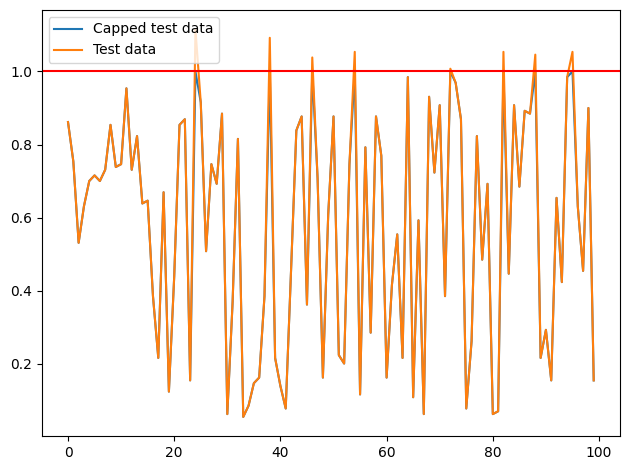

In [22]:
plt.plot(y_test_capped_scaled_lstm, label='Capped test data')
plt.plot(y_test_scaled_lstm, label='Test data')
plt.axhline(y=1.0, color='red')
plt.legend()
plt.tight_layout()
plt.show()

In [31]:
# save preprocessed data for lstm
X_train_scaled_lstm.to_parquet(PROCESSED_DATA_PATH / 'X_train_scaled_lstm.parquet', engine='pyarrow', compression='snappy') # need this as df
X_test_scaled_lstm.to_parquet(PROCESSED_DATA_PATH / 'X_test_scaled_lstm.parquet', engine='pyarrow', compression='snappy') # need this as df
np.save(PROCESSED_DATA_PATH / 'y_train_scaled_lstm.npy', y_train_scaled_lstm)
np.save(PROCESSED_DATA_PATH / 'y_test_scaled_lstm.npy', y_test_scaled_lstm)
np.save(PROCESSED_DATA_PATH / 'y_test_capped_scaled_lstm.npy', y_test_capped_scaled_lstm)

### Prepare dataframe for lstm with auxiliary feature sensor prediction

In order to get a dataframe for lstm with auxiliary feature sensor prediction, we will need a failure vector. There are 2 ways to determine this, either by visual inspection or by statistical analysis. In both cases, it is the goal to find out if a feature or sensor has an upward, downward or neutral trend. For upward, we can define the failure as 1.0, for downward as 0.0 and for neutral take the average value.

#### Visual inspection

Visual inspection can be done with the plot in the outputs/figures/features_over_time_all_engines.png, where for each engine the sensors are plotted. We see an upward trend for:
1. (LPC outlet temperature) (◦R)
2. (HPC outlet temperature) (◦R)
3. (LPT outlet temperature) (◦R)
4. (Physical fan speed) (rpm)
5. (HPC outlet Static pressure) (psia)
6. (Corrected fan speed) (rpm)
7. (Bypass Ratio)
8. (Bleed Enthalpy)

Wee see a downward trend for:
1. (HPC outlet pressure) (psia)
2. (Ratio of fuel flow to Ps30) (pps/psia)
3. (High-pressure turbines Cool air flow) (lbm/s)
4. (Low-pressure turbines Cool air flow) (lbm/s)

No clear trend for:
1. (bypass duct pressure) (psia)
2. (Physical core speed) (rpm)

#### Statistical Analysis

In [34]:
df_train.columns

Index(['engine', 'cycle', 'throttle resolver angle', 'altitude',
       '(LPC outlet total temperature) (◦R)',
       '(HPC outlet total temperature) (◦R)',
       '(LPT outlet total temperature) (◦R)',
       '(bypass-duct total pressure) (psia)',
       '(HPC outlet total pressure) (psia)', '(Physical fan speed) (rpm)',
       '(Physical core speed) (rpm)', '(HPC outlet Static pressure) (psia)',
       '(Ratio of fuel flow to Ps30) (pps/psia)',
       '(Corrected fan speed) (rpm)', '(Bypass Ratio) ', '(Bleed Enthalpy)',
       '(High-pressure turbines coolant bleed) (lbm/s)',
       '(Low-pressure turbines coolant bleed) (lbm/s)', 'RUL'],
      dtype='object')

In [35]:
df_train[final_features].columns

Index(['cycle', '(LPC outlet total temperature) (◦R)',
       '(HPC outlet total temperature) (◦R)',
       '(LPT outlet total temperature) (◦R)',
       '(bypass-duct total pressure) (psia)',
       '(HPC outlet total pressure) (psia)', '(Physical fan speed) (rpm)',
       '(Physical core speed) (rpm)', '(HPC outlet Static pressure) (psia)',
       '(Ratio of fuel flow to Ps30) (pps/psia)',
       '(Corrected fan speed) (rpm)', '(Bypass Ratio) ', '(Bleed Enthalpy)',
       '(High-pressure turbines coolant bleed) (lbm/s)',
       '(Low-pressure turbines coolant bleed) (lbm/s)'],
      dtype='object')

In [36]:
grouped_corr = df_train.groupby('engine').apply(lambda x: x[final_features].corr()['cycle'], include_groups=False)
grouped_corr

cycle,cycle,(LPC outlet total temperature) (◦R),(HPC outlet total temperature) (◦R),(LPT outlet total temperature) (◦R),(bypass-duct total pressure) (psia),(HPC outlet total pressure) (psia),(Physical fan speed) (rpm),(Physical core speed) (rpm),(HPC outlet Static pressure) (psia),(Ratio of fuel flow to Ps30) (pps/psia),(Corrected fan speed) (rpm),(Bypass Ratio),(Bleed Enthalpy),(High-pressure turbines coolant bleed) (lbm/s),(Low-pressure turbines coolant bleed) (lbm/s)
engine,,,,,,,,,,,,,,,
1,1.0,0.693328,0.583419,0.824079,NaN,-0.798544,0.805492,-0.442325,0.842075,-0.838586,0.832732,0.723805,0.685718,-0.729856,-0.763344
2,1.0,0.786519,0.734746,0.830417,0.217017,-0.803818,0.783505,0.834042,0.854874,-0.825149,0.802666,0.805365,0.727412,-0.767857,-0.779092
3,1.0,0.662832,0.697529,0.789526,0.030722,-0.718997,0.521406,0.842215,0.805309,-0.741897,0.472043,0.752940,0.700308,-0.715138,-0.705753
4,1.0,0.613150,0.594448,0.691810,0.065502,-0.682597,0.365921,0.831509,0.750720,-0.714723,0.350529,0.722589,0.677802,-0.681398,-0.654289
5,1.0,0.708256,0.727345,0.836064,0.282401,-0.814818,0.743156,0.850141,0.841064,-0.828896,0.742790,0.745069,0.729881,-0.779249,-0.772239
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,1.0,0.710404,0.721151,0.815938,0.094210,-0.813435,0.785771,0.746430,0.851777,-0.817641,0.765907,0.734006,0.704762,-0.764080,-0.744604
97,1.0,0.639325,0.618785,0.683497,0.060880,-0.695525,0.294459,0.836175,0.715779,-0.663801,0.175876,0.663111,0.656294,-0.648675,-0.682678
98,1.0,0.738851,0.717903,0.824137,0.082402,-0.789668,0.835720,-0.332916,0.870180,-0.858214,0.844135,0.800483,0.752889,-0.769496,-0.779037


In [37]:
is_upward = (grouped_corr > 0).all()
is_downward = (grouped_corr < 0).all()

labels = np.select(
    [is_upward, is_downward],
    ['upward_trend', 'downward_trend'],
    default='no_clear_trend'
)

# Create a summary DataFrame
summary_trend = pd.DataFrame([labels], columns=grouped_corr.columns, index=['Trend']).T

# trend order
trend_order = ['upward_trend', 'downward_trend', 'no_clear_trend']
summary_trend['Trend'] = pd.Categorical(summary_trend['Trend'], categories=trend_order, ordered=True)
summary_trend_sorted = summary_trend.sort_values(by='Trend')
print(summary_trend_sorted)

                                                         Trend
cycle                                                         
cycle                                             upward_trend
(LPC outlet total temperature) (◦R)               upward_trend
(HPC outlet total temperature) (◦R)               upward_trend
(LPT outlet total temperature) (◦R)               upward_trend
(Physical fan speed) (rpm)                        upward_trend
(HPC outlet Static pressure) (psia)               upward_trend
(Corrected fan speed) (rpm)                       upward_trend
(Bypass Ratio)                                    upward_trend
(Bleed Enthalpy)                                  upward_trend
(HPC outlet total pressure) (psia)              downward_trend
(Ratio of fuel flow to Ps30) (pps/psia)         downward_trend
(High-pressure turbines coolant bleed) (lbm/s)  downward_trend
(Low-pressure turbines coolant bleed) (lbm/s)   downward_trend
(bypass-duct total pressure) (psia)             no_clea

In [38]:
summary_trend_sorted_dict = summary_trend_sorted.to_dict()
summary_trend_sorted_dict

{'Trend': {'cycle': 'upward_trend',
  '(LPC outlet total temperature) (◦R)': 'upward_trend',
  '(HPC outlet total temperature) (◦R)': 'upward_trend',
  '(LPT outlet total temperature) (◦R)': 'upward_trend',
  '(Physical fan speed) (rpm)': 'upward_trend',
  '(HPC outlet Static pressure) (psia)': 'upward_trend',
  '(Corrected fan speed) (rpm)': 'upward_trend',
  '(Bypass Ratio) ': 'upward_trend',
  '(Bleed Enthalpy)': 'upward_trend',
  '(HPC outlet total pressure) (psia)': 'downward_trend',
  '(Ratio of fuel flow to Ps30) (pps/psia)': 'downward_trend',
  '(High-pressure turbines coolant bleed) (lbm/s)': 'downward_trend',
  '(Low-pressure turbines coolant bleed) (lbm/s)': 'downward_trend',
  '(bypass-duct total pressure) (psia)': 'no_clear_trend',
  '(Physical core speed) (rpm)': 'no_clear_trend'}}

The visual inspection and the statistical analysis fit perfectly together. They show the same trend for all features.

#### Define feature-error vector and insert into X_train_scaled_lstm

At the end I want to insert the feature-error vector into scaled-training-dataset for the final timestep, so I will choose 1.0 for upward trend columns, 0.0 for downward trend columns and the mean value for every no clear trend column.

In [39]:
y_train_scaled_lstm_df = pd.DataFrame(y_train_scaled_lstm, columns=['RUL'])
y_train_scaled_lstm_df.tail()

,RUL
20626,0.030769
20627,0.023077
20628,0.015385
20629,0.007692
20630,0.000000


In [40]:
df_train_scaled_lstm = pd.concat([X_train_scaled_lstm, y_train_scaled_lstm_df], axis=1)
df_train_scaled_lstm.tail()

,engine,cycle,(LPC outlet total temperature) (◦R),(HPC outlet total temperature) (◦R),(LPT outlet total temperature) (◦R),(bypass-duct total pressure) (psia),(HPC outlet total pressure) (psia),(Physical fan speed) (rpm),(Physical core speed) (rpm),(HPC outlet Static pressure) (psia),(Ratio of fuel flow to Ps30) (pps/psia),(Corrected fan speed) (rpm),(Bypass Ratio),(Bleed Enthalpy),(High-pressure turbines coolant bleed) (lbm/s),(Low-pressure turbines coolant bleed) (lbm/s),RUL
20626,100,0.540166,0.686747,0.587312,0.782917,1.0,0.254428,0.439394,0.196491,0.726190,0.170576,0.558824,0.656791,0.750000,0.271318,0.109500,0.030769
20627,100,0.542936,0.701807,0.729453,0.866475,1.0,0.162641,0.500000,0.194651,0.708333,0.211087,0.500000,0.727203,0.583333,0.124031,0.366197,0.023077
20628,100,0.545706,0.665663,0.684979,0.775321,1.0,0.175523,0.515152,0.198196,0.738095,0.281450,0.529412,0.922278,0.833333,0.232558,0.053991,0.015385
20629,100,0.548476,0.608434,0.746021,0.747468,1.0,0.133655,0.530303,0.233285,0.916667,0.208955,0.514706,0.823394,0.583333,0.116279,0.234466,0.007692
20630,100,0.551247,0.795181,0.639634,0.842167,1.0,0.151369,0.545455,0.178363,0.803571,0.130064,0.558824,0.687572,0.666667,0.178295,0.218172,0.000000


In [41]:
# first implement for one engine
def add_feature_error(engine_id, df_train_scaled, summary_trend_sorted_dict):
    df_train_scaled_engine = df_train_scaled[df_train_scaled['engine'] == engine_id]

    feature_error_data = pd.Series(index=df_train_scaled_engine.columns, dtype=float)

    feature_error_data['engine'] = float(engine_id)

    if len(df_train_scaled_engine) >= 2:
        scaled_cycle_val_last = df_train_scaled_engine['cycle'].iloc[-1]
        scaled_cycle_val_second_last = df_train_scaled_engine['cycle'].iloc[-2]
        scaled_cycle_diff = scaled_cycle_val_last - scaled_cycle_val_second_last
        feature_error_data['cycle'] = scaled_cycle_val_last + scaled_cycle_diff
    else:
        feature_error_data['cycle'] = df_train_scaled_engine['cycle'].iloc[-1]

    feature_error_data['RUL'] = 0.0 # RUL for future state is typically 0

    # Handle other feature columns based on trend
    for col in df_train_scaled_engine.columns:
        if col not in ['engine', 'cycle', 'RUL']:
            trend = summary_trend_sorted_dict['Trend'].get(col)
            if trend == 'upward_trend':
                feature_error_data[col] = 1.0
            elif trend == 'downward_trend':
                feature_error_data[col] = 0.0
            else: # 'no_clear_trend' or not found in dict
                feature_error_data[col] = df_train_scaled_engine[col].mean()

    feature_error_df = pd.DataFrame([feature_error_data])
    df_train_scaled_engine_with_error_vector = pd.concat([df_train_scaled_engine, feature_error_df], ignore_index=True)
    return df_train_scaled_engine_with_error_vector

def create_df_with_feature_errors(df_train_scaled, summary_trend_dict):
    df_engines_with_error_vectors = []
    for engine_id in df_train_scaled['engine'].unique():
        df_train_scaled_engine_with_error_vector = add_feature_error(engine_id, df_train_scaled, summary_trend_sorted_dict)
        df_engines_with_error_vectors.append(df_train_scaled_engine_with_error_vector)
    return pd.concat(df_engines_with_error_vectors, ignore_index=True)

df_train_scaled_lstm_with_error_vector = create_df_with_feature_errors(df_train_scaled_lstm, summary_trend_sorted_dict)

In [42]:
df_train_scaled_lstm_with_error_vector[df_train_scaled_lstm_with_error_vector['engine']==1].tail()

,engine,cycle,(LPC outlet total temperature) (◦R),(HPC outlet total temperature) (◦R),(LPT outlet total temperature) (◦R),(bypass-duct total pressure) (psia),(HPC outlet total pressure) (psia),(Physical fan speed) (rpm),(Physical core speed) (rpm),(HPC outlet Static pressure) (psia),(Ratio of fuel flow to Ps30) (pps/psia),(Corrected fan speed) (rpm),(Bypass Ratio),(Bleed Enthalpy),(High-pressure turbines coolant bleed) (lbm/s),(Low-pressure turbines coolant bleed) (lbm/s),RUL
188,1.0,0.520776,0.894578,0.547853,0.772451,1.0,0.136876,0.560606,0.102396,0.732143,0.189765,0.661765,0.744132,0.583333,0.263566,0.301712,0.023077
189,1.0,0.523546,0.731928,0.614345,0.737677,1.0,0.231884,0.590909,0.084582,0.880952,0.287846,0.691176,0.759523,0.833333,0.271318,0.239299,0.015385
190,1.0,0.526316,0.641566,0.682799,0.734639,1.0,0.172303,0.575758,0.094364,0.773810,0.187633,0.617647,0.740669,0.500000,0.240310,0.324910,0.007692
191,1.0,0.529086,0.701807,0.662089,0.758778,1.0,0.225443,0.636364,0.051557,0.833333,0.296375,0.647059,0.717199,0.666667,0.263566,0.097625,0.000000
192,1.0,0.531856,1.000000,1.000000,1.000000,1.0,0.000000,1.000000,0.119070,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000


In [43]:
# split df_train_scaled_lstm_with_error_vector into X and y
X_train_scaled_lstm_with_error_vector = df_train_scaled_lstm_with_error_vector[['engine'] + final_features]
y_train_scaled_lstm_with_error_vector = df_train_scaled_lstm_with_error_vector.iloc[:,-1]

In [44]:
# save preprocessed data for lstm with failure vector
df_train_scaled_lstm_with_error_vector.to_parquet(
    PROCESSED_DATA_PATH / 'df_train_scaled_lstm_with_error_vector.parquet', 
    engine='pyarrow', 
    compression='snappy'
    )
df_train_scaled_lstm.to_parquet(
    PROCESSED_DATA_PATH / 'df_train_scaled_lstm.parquet', 
    engine='pyarrow', 
    compression='snappy'    
)
np.save(PROCESSED_DATA_PATH / 'X_train_scaled_lstm_with_error_vector.npy', X_train_scaled_lstm_with_error_vector.values)
np.save(PROCESSED_DATA_PATH / 'X_train_scaled_lstm_with_error_vector.npy', y_train_scaled_lstm_with_error_vector.values)

## 4. Dataset and Dataloader for LSTM

### 4.1 Datasets for Vanilla-LSTM

In [53]:
import torch
from torch.utils.data import Dataset, DataLoader

class SequenceDataset(Dataset):
    def __init__(self, df, feature_names, window_size=30):
        self.df = df
        self.feature_names = feature_names
        self.window_size = window_size
        self.sequences, self.targets = self._create_sequences()

    def _create_sequences(self):
        sequences = []
        targets = []

        for engine_id in self.df['engine'].unique():
            engine_data = self.df[self.df['engine'] == engine_id]
            features = engine_data[self.feature_names].values
            rul_values = engine_data['RUL'].values

            if len(features) >= self.window_size:
                for idx in range(len(features) - self.window_size + 1):
                    sequences.append(features[idx:idx+self.window_size])
                    targets.append(rul_values[idx+self.window_size-1])

        return torch.tensor(np.array(sequences), dtype=torch.float32), torch.tensor(np.array(targets), dtype=torch.float32)

    def __len__(self):
        return self.sequences.shape[0]

    def __getitem__(self, idx):
        item = {}
        item["seq"] = self.sequences[idx]
        item["target"] = self.targets[idx]
        return item

def collate_fn(batch):
    sequences = torch.stack([item['seq'] for item in batch])
    targets = torch.stack([item['target'] for item in batch])
    return sequences, targets

sequences_dataset = SequenceDataset(df_train_scaled_lstm, final_features)
train_loader = DataLoader(sequences_dataset, batch_size=128, shuffle=True, collate_fn=collate_fn)
for x,y in train_loader:
    print(x.shape, y.shape)
    break

torch.Size([128, 30, 15]) torch.Size([128])


In [ ]:
class TestSequenceDataset(Dataset):
    """Extra Dataset-Class necessary because we just want to predict the last timestep for the test-dataset"""
    def __init__(self, X_test, feature_names, y_test, window_size=30):
        self.X_test = X_test
        self.feature_names = feature_names
        self.y_test = y_test
        self.window_size = window_size
        self.sequences, self.targets = self._create_sequences() # Call without extra args

    def _create_sequences(self):
        sequences = []
        targets = []

        for i, engine_id in enumerate(self.X_test['engine'].unique()):
            engine_data = self.X_test[self.X_test['engine'] == engine_id] # Fixed typo 'enginge'
            features = engine_data[self.feature_names].values

            true_rul = self.y_test[i, 0]

            if len(features) >= self.window_size:
                sequence = features[-self.window_size:]
            else:
                padding_needed = self.window_size - len(features)
                padding = np.zeros((padding_needed, features.shape[1]), dtype=features.dtype)
                sequence = np.concatenate((padding, features), axis=0) # Left pad

            sequences.append(sequence)
            targets.append(true_rul)

        return torch.tensor(sequences, dtype=torch.float32), torch.tensor(targets, dtype=torch.float32)

    def __len__(self):
        return self.sequences.shape[0]

    def __getitem__(self, idx):
        item = {}
        item["seq"] = self.sequences[idx]
        item["target"] = self.targets[idx]
        return item

test_sequence_dataset = TestSequenceDataset(X_test_scaled_lstm, final_features, y_test_scaled_lstm) # or you could pass y_test_scaled_lstm_capped
test_loader = DataLoader(test_sequence_dataset, batch_size=128, shuffle=True, collate_fn=collate_fn)
for x,y in test_loader:
    print(x.shape, y.shape)

torch.Size([100, 30, 15]) torch.Size([100])


## 4.2 Datasets for LSTM with auxiliary sensor feature prediction

In [68]:
class SequenceShiftedDataset(Dataset):
    def __init__(self, df, feature_names, window_size=30, lookahead=10, noise_std=0.01):
        self.df = df
        self.feature_names = feature_names
        self.window_size = window_size
        self.lookahead = lookahead
        self.noise_std = noise_std
        self.sequences, self.sequences_shifted, self.targets = self._create_sequences()

    def _create_sequences(self):
        sequences = []
        sequences_shifted = []
        targets = []

        for engine_id in self.df['engine'].unique():
            # extract componentes
            engine_data = self.df[self.df['engine'] == engine_id]
            features = engine_data[self.feature_names].values
            cycle_values = engine_data['cycle'].values
            rul_values = engine_data['RUL'].values
            # get failure vector
            failure_vector = features[-1:]
            # temp extension for cycles
            cycle_diff = cycle_values[-1] - cycle_values[-2] if len(cycle_values) > 1 else 0.01
            extension_cycles = np.array([cycle_values[-1] + (i+1)*cycle_diff for i in range(self.lookahead)])
            # extension for features
            extension_noise = np.random.normal(0, self.noise_std, (self.lookahead, features.shape[1]))
            extension_features = np.tile(failure_vector, (self.lookahead, 1)) + extension_noise
            extension_features = np.clip(extension_features, 0.0, 1.0)
            # full extended features
            full_features_ext = np.vstack([features, extension_features])
            # replace cycles
            if 'cycle' in self.feature_names:
                cycle_idx = self.feature_names.index('cycle')
                full_features_ext[len(features):, cycle_idx] = extension_cycles
            # extend rul
            extension_rul = np.zeros(self.lookahead)
            rul_ext = np.concatenate([rul_values, extension_rul])

            if len(features) >= self.window_size:
                for idx in range(len(features) - self.window_size + 1):
                    sequences.append(full_features_ext[idx:idx+self.window_size])
                    sequences_shifted.append(full_features_ext[idx+self.lookahead:idx+self.lookahead+self.window_size])
                    targets.append(rul_ext[idx+self.window_size-1])

        return torch.tensor(np.array(sequences), dtype=torch.float32), torch.tensor(np.array(sequences_shifted), dtype=torch.float32), torch.tensor(np.array(targets), dtype=torch.float32)

    def __len__(self):
        return self.sequences.shape[0]

    def __getitem__(self, idx):
        item = {}
        item["seq"] = self.sequences[idx]
        item["seq_shifted"] = self.sequences_shifted[idx]
        item["target"] = self.targets[idx]
        return item

def collate_fn(batch):
    sequences = torch.stack([item['seq'] for item in batch])
    sequences_shifted = torch.stack([item['seq_shifted'] for item in batch])
    targets = torch.stack([item['target'] for item in batch])
    return sequences, sequences_shifted, targets

sequences_shifted_dataset = SequenceShiftedDataset(df_train_scaled_lstm_with_error_vector, final_features)
train_loader = DataLoader(sequences_shifted_dataset, batch_size=128, shuffle=True, collate_fn=collate_fn)
for x,y,z in train_loader:
    print(x.shape, y.shape, z.shape)
    break

torch.Size([128, 30, 15]) torch.Size([128, 30, 15]) torch.Size([128])


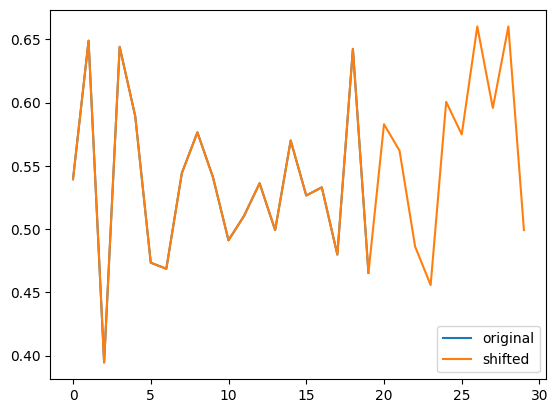

In [69]:
lookahead = 10
plt.plot(x[0,lookahead:,5], label="original")
plt.plot(y[0,:,5], label="shifted")
plt.legend()
plt.show()

Test-Sequence-Dataset is the same for LSTM-Vanilla and LSTM-auxiliary-sensor-feature-prediction.